# Stock Analysis

In [1]:
stock_ticker = 'ACC'          #Change ticker name here and re-run the notebook
ema          = (30,60,200)          #Set periods for Exponentail Moving Average
focus_period = 1000                 #Filter period for focus. If set only last 150 trading days data will be shown for analysis.

**Installing Package**

In [2]:
# Install package
%pip install --upgrade portfoliotools

Requirement already up-to-date: portfoliotools in /Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages (1.0.12)
You should consider upgrading via the 'pip install --upgrade pip' command.
Note: you may need to restart the kernel to use updated packages.


In [3]:
from portfoliotools.screener.stock_detail import StockDetail
from portfoliotools.screener.stock_fundamentals import StockFundamentals
#from portfoliotools.screener.screener_pattern import CandleStickPatters
from portfoliotools.screener.utility.util import NumToStr, flatten_dicts_of_dicts, backTestStrategy, slope, get_arima_predictions
import pandas as pd
import numpy as np
import seaborn as sns
import plotly.graph_objects as go
import matplotlib.pyplot as plt
from IPython.display import display_html
from pandas.plotting import register_matplotlib_converters
from plotly.subplots import make_subplots
import nsetools

import warnings
warnings.filterwarnings("ignore")
register_matplotlib_converters()
%matplotlib inline
sns.set()
pd.options.display.max_columns = None
pd.options.display.max_rows = None

nse = nsetools.Nse()
if not nse.is_valid_code(stock_ticker) and "NIFTY" not in stock_ticker:
    raise(Exception("Not a Valid Ticker"))
def display_side_by_side(*args):
    html_str=''
    for df in args:
        html_str+=df.to_html()
    display_html(html_str.replace('table','table style="display:inline"'),raw=True)

In [4]:
stockObj = StockDetail(stock_ticker, period = focus_period)
stock_funda = StockFundamentals(stock_ticker)
details = stockObj.details()
details_funda = stock_funda.get_details_info()

### <font color = "red">Overview</font>

In [5]:
info = details['Overview']['Info']
info['Beta'] = details_funda.get('Beta (5Y monthly)')
df1 = pd.DataFrame(data = np.array(list(info.values())), index = np.array(list(info.keys())), columns = ['Overview'])
info = details['Overview']['52W Statistics']
df2 = pd.DataFrame(data = np.array(list(info.values())), index = np.array(list(info.keys())), columns = ['52W Stats'])
info = details['Overview']['Returns']
df3 = pd.DataFrame(data = np.array(list(info.values())), index = np.array(list(info.keys())), columns = ['Return Stats'])
info = details['Fundamental Analytics']
info['Trailing P/E'] = details_funda.get('Trailing P/E')
info['Forward P/E']  = details_funda.get('Forward P/E')
info['P/B']          = details_funda.get('Price/book')
info['PEG Ratio']    = details_funda.get('PEG Ratio (5 yr expected)')
info['Debt/Equity']  = details_funda.get('Total debt/equity')
info['ROA']          = details_funda.get('Return on assets')
info['ROE']          = details_funda.get('Return on equity')
df4 = pd.DataFrame(data = np.array(list(info.values())), index = np.array(list(info.keys())), columns = ['Fundamentals'])
info = flatten_dicts_of_dicts(details['Technical Analytics'])
df5 = pd.DataFrame( data = info.values(), index = np.array(list(info.keys())), columns = ['Technical Signals'])
cols = [col for col in df5.index.tolist() if 'Signal' in col or 'Portfolio' in col]
df5 = df5.loc[cols,:]
display_side_by_side(df1,df2,df3,df4,df5)

,Overview
Stock Name,ACC
Date,18Jun21
Last Close,2042.2
Last COB,17Jun21
Average Volume,1002690.84
Standard Deviation,47.35
CAGR,13.82
Annual Volatility,32.13
Sharpe,0.321
Sortino,0.484


## <font color = 'red'>Fundamental Analysis</font>

### - Details 
    Balance sheet
    Cash Flow
    Key Statistics
    Income Statement

In [6]:
info = stock_funda.get_balance_sheet_info()
df1 = pd.DataFrame( data = NumToStr(info.values()), index = np.array(list(info.keys())), columns = ['Balance Sheet'])
info = stock_funda.get_financial_info()
df2 = pd.DataFrame( data = NumToStr(info.values()), index = np.array(list(info.keys())), columns = ['Financial Info'])
info = stock_funda.get_cash_flow_info()
df3 = pd.DataFrame( data = NumToStr(info.values()), index = np.array(list(info.keys())), columns = ['Cash Flow Info'])
info = stock_funda.get_key_statistics()
df4 = pd.DataFrame( data = NumToStr(info.values()), index = np.array(list(info.keys())), columns = ['Key Statistics'])
info = stock_funda.get_summary_statistics()
df5 = pd.DataFrame( data = NumToStr(info.values()), index = np.array(list(info.keys())), columns = ['Summary Statistics'])
display_side_by_side(df1, df3, df4, df2, df5)

,Balance Sheet
Assets,nan
Current assets,nan
Cash,nan
Cash and cash equivalents,"58,493,600.0"
Other short-term investments,"2,567,500.0"
Total cash,"61,061,100.0"
Net receivables,"4,514,100.0"
Inventory,"9,012,700.0"
Other current assets,"6,907,600.0"
CurrAsset,"84,486,300.0"


## <font color = "red">Technical Analysis</font>

In [7]:
data = stockObj.generate_moving_averages(exponential=ema)
data = data.tail(focus_period) # last 150 periods

### - Close Price vs Volumne

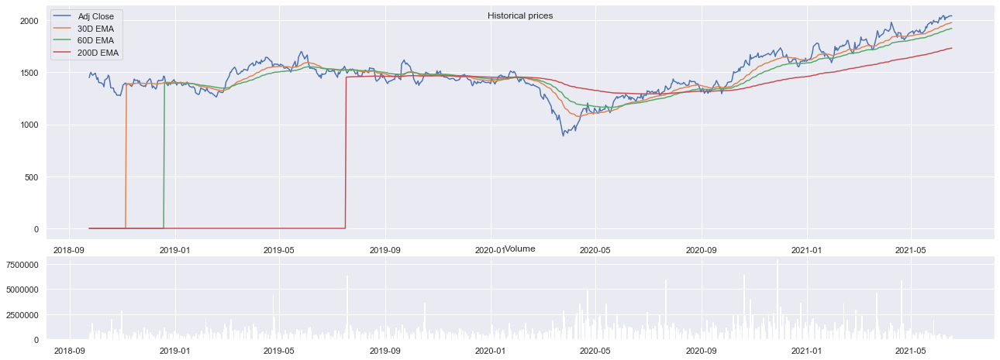

In [8]:
# Adjusted Close & Volumne - Historical
fig = plt.figure(figsize = (17,6))
fig.suptitle("Historical prices")

ax1 = fig.add_axes([0,.3,1,.7])
ax1.plot(data.index, data['Adj Close'], label = 'Adj Close')
ax1.legend()
for period in ema:
    col = '{0}D Exponential Moving Average'.format(period)
    label = '{0}D EMA'.format(period)
    ax1.plot( data.index, data[col], label = label)
    ax1.legend()

ax2 = fig.add_axes([0,0,1,.25])
ax2.set_title("Volume")
vol = data['Volume']#np.log10(data['Volume'])
#vol_cmap = data['Volume'].apply(lambda x, vol: 'rgb(250,0,0)' if x<vol else 'rgb(0,250,0)',vol = vol.mean())
ax2.bar(data.index, vol)
#ax2.set_ylim([vol.min()-.5, vol.max() + .5])
#ax2.plot(data.index, [vol.mean()]*len(vol), color = vol_cmap.tolist())
plt.show()

### Bollinger Bands

In [9]:
data = stockObj.get_bollinger_details().tail(focus_period)

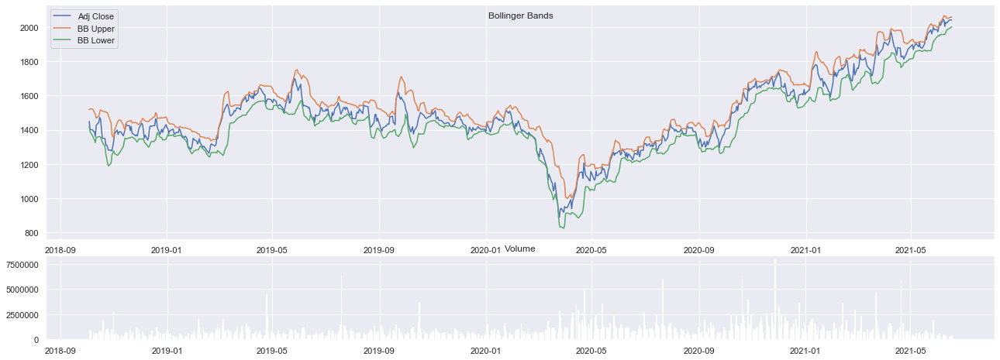

In [10]:
fig = plt.figure(figsize = (17,6))
fig.suptitle("Bollinger Bands")

ax1 = fig.add_axes([0,.3,1,.7])
ax1.plot(data.index, data['Adj Close'], label = 'Adj Close')
ax1.legend()
for part in ['Upper', 'Lower']:
    col = 'Bollinger Band {0}'.format(part)
    label = 'BB {0}'.format(part)
    ax1.plot( data.index, data[col], label = label)
    ax1.legend()

ax2 = fig.add_axes([0,0,1,.25])
ax2.set_title("Volume")
vol = data['Volume']
ax2.bar(data.index, vol)
plt.show()

### - Close Price Candle Stick

In [11]:
## Candle Stick - Historical
fig = go.Figure(data=[go.Candlestick(x=data.index,
                       open=data['Open'], high=data['High'],
                       low=data['Low'], close=data['Close'])])
#fig.layout.xaxis.type = 'category'
fig.show()

### - Williams R
**Description:** %D is 5 day smooth average of %R. Buy signal is triggered when %D is less than -75 and volume is more than 1.25 times avg 5 day volume. Sell signal is triggered when %D is more than -20 and volume is more than 1.25 times avg 5 day volume.

**Backtest Strategy**: Passive - Portfolio starts with 100% cash and there is no repump of cash into portfolio i.e. if there is a buy signal when no cash is in the portfolio, Buy order is not executed.
Active - Portfolio starts with 100% cash and at each Buy signal, initial cash is re-pumped into portfolio if there is not enough cash left for investment.

In [12]:
#data = stockObj.get_williams_r_details()[2] # To get williams R data frame
fig = stockObj.plot_williams_r_details(period = focus_period)
fig.show()

### - MACD
**Descrption**: MACD is momentum indicator. MACD Line is EMA(12D) - EMA(26D). MACD Indicator is exponential moving average of MACD.
When MACD Line crosses MACD Indicator from top, it's a BUY zone. When MACD Line crosses MACD Indicator from below, it's a SELL zone. BUY signal is generated when BUY Zone creates a maxima based on 9 day period. SELL signal is generated when SELL Zone creates a maxima.

**Backtest Strategy**: Passive - Portfolio starts with 100% cash and there is no repump of cash into portfolio i.e. if there is a buy signal when no cash is in the portfolio, Buy order is not executed.
Active - Portfolio starts with 100% cash and at each Buy signal, initial cash is re-pumped into portfolio if there is not enough cash left for investment.

In [13]:
fig = stockObj.plot_macd_details(period = focus_period)
fig.show()

### - RSI
**Descrption**: Relative Stregth Index(RSI) is momentum indicator. Relative Strength is calculated as ration of Average Gains to Average Loss. RS is then indexed to calculate RSI.

**Formula:** RS = Avg Gain/Avg Loss; 
RSI = 100 - 100/(1+RS)

Buy signal is given when RSI < 30.
Sell signal is given when RSI > 70.

**Backtest Strategy**: Passive - Portfolio starts with 100% cash and there is no repump of cash into portfolio i.e. if there is a buy signal when no cash is in the portfolio, Buy order is not executed.
Active - Portfolio starts with 100% cash and at each Buy signal, initial cash is re-pumped into portfolio if there is not enough cash left for investment.

In [14]:
fig = stockObj.plot_rsi_details(period = focus_period)
fig.show()

### - OBV
**Description:** OBV is a momentum indicator. BUY signal is triggered when OBV Index is less than 0 and rate of OBV Index change is more than 60. SELL signal is triggered when OBV Index is more than 0 and rate of OBV Index change is more than 60.

**Backtest Strategy**: Passive - Portfolio starts with 100% cash and there is no repump of cash into portfolio i.e. if there is a buy signal when no cash is in the portfolio, Buy order is not executed.
Active - Portfolio starts with 100% cash and at each Buy signal, initial cash is re-pumped into portfolio if there is not enough cash left for investment.

In [15]:
fig = stockObj.plot_obv_details(period = focus_period)
fig.show()

### ADX/ATR
**Description:**

**ADX Value  	        Trend Strength**

0-25	                Absent or Weak Trend

25-50	                Strong Trend

50-75	                Very Strong Trend

75-100	                Extremely Strong Trend


In [16]:
data = stockObj.get_adx_details()
data = data.join(stockObj.get_atr_details()['ATR'])
data.dropna(inplace = True)
data = data.tail(focus_period)

In [17]:
fig = make_subplots(rows = 3, cols = 1, shared_xaxes= True, vertical_spacing = 0.08, 
    column_widths = [15], row_heights = [2,2,2],
    specs=[[{"secondary_y": True}], [{"secondary_y": False}], [{"secondary_y": False}]])

hovertext      = ["<br>Close : " + "{:,}".format(np.round(txt['Close'],2)) + 
                    "<br>High: " + "{:,}".format(np.round(txt['High'],2)) + 
                    "<br>Low: " + "{:,}".format(np.round(txt['Low'],2)) + 
                    "<br>Volume: " + "{:,}".format(txt['Volume']) + 
                    "<br>ATR: " + "{:,}".format(np.round(txt['ATR'],2)) +
                    "<br>ADX: " + "{:,}".format(np.round(txt['ADX'],2))
                    for txt in data.to_dict(orient = "records")]
# Add Close Price
fig.add_trace(
go.Scatter(x=data.index, y=data['Close'], name="Close", text = hovertext, line = {'color':'purple'}), row = 2, col =1,
)
# Add ADX
fig.add_trace(
go.Scatter(x=data.index, y=data['ADX'], name="ADX", text = hovertext, line = {'color':'darkgray'}), row = 1, col =1,
)
# Add ATR
fig.add_trace(
go.Scatter(x=data.index, y=data['ATR'], name="ATR", text = hovertext, line = {'color':'black'}), row = 1, col =1,
secondary_y = True)                                                       
# Add Volume
fig.add_trace(
go.Scatter(x=data.index, y=data['Volume'], name="Volume", text = hovertext, line = {'color':'black'}), row = 3, col =1,
)
fig['layout']['yaxis1'].update(title='ADX')
fig['layout']['yaxis2'].update(title='ATR')
fig['layout']['yaxis3'].update(title='Close')
fig['layout']['yaxis4'].update(title='Volume')
fig.show()

### Combined Analysis

In [18]:
combined_analysis = stockObj.technical_details
combined_analysis.dropna()

Prices                                                    \
                   High          Low         Open        Close     Volume   
Date                                                                        
2018-10-16  1498.986981  1430.814667  1444.183641  1472.865356   885505.0   
2018-10-17  1496.189778  1439.442679  1491.448999  1459.875366   799424.0   
2018-10-19  1403.270538  1335.951479  1403.270538  1350.553101  2009651.0   
2018-10-22  1357.285033  1333.675931  1350.553150  1348.419800   586762.0   
2018-10-23  1336.804925  1303.714263  1336.804925  1309.403198   994439.0   
2018-10-24  1334.055267  1289.491943  1317.747033  1310.635864  1111875.0   
2018-10-25  1308.360362  1287.311231  1289.729075  1296.697998   725333.0   
2018-10-26  1298.973414  1273.562793  1298.973414  1279.678467   475607.0   
2018-11-07  1390.660197  1379.566819  1385.160962  1386.488403    53528.0   
2018-11-09  1395.258752  1375.157779  1381.842324  1388.147583   371527.0   
2018-11-12  1396.681063  1357.806672  1389.000908  1364.111816   307104.0   
2018-11-13  1389.379958  1350.173742  1360.603455  1381.652466   458083.0   
2018-11-14  1409.907757  1374.825990  1386.203861  1397.486938   711063.0   
2018-11-15  1439.300546  1376.485222  1401.374313  1435.081299   705817.0   
2018-11-16  1448.781954  1414.837933  1438.162657  1423.561035   651765.0   
2018-11-19  1444.088776  1404.598062  1424.698920  1423.798218   921530.0   
2018-11-20  1420.621887  1391.229057  1413.700303  1393.741577   462997.0   
2018-11-21  1427.069255  1387.341504  1398.529789  1419.484009   444633.0   
2018-11-22  1420.906352  1375.442325  1420.337482  1380.989014   733505.0   
2018-11-26  1390.517913  1354.914617  1385.729680  1364.490967  1177139.0   
2018-11-27  1378.902943  1356.479037  1358.944218  1370.227295   564890.0   
2018-11-28  1380.514806  1358.849470  1374.778418  1362.452393   510905.0   
2018-11-29  1395.021691  1361.693991  1373.782978  1387.910522   994648.0   
2018-11-30  1420.337421  1387.341553  1387.341553  1408.485474   600458.0   
2018-12-03  1450.678330  1407.157957  1419.389189  1438.162720   720915.0   
2018-12-04  1450.251706  1423.181812  1440.248616  1430.719604   405000.0   
2018-12-05  1428.396803  1389.854244  1426.026413  1394.879517   514306.0   
2018-12-06  1386.203758  1343.394501  1386.203758  1349.984253   330634.0   
2018-12-07  1372.597822  1352.070225  1352.070225  1368.236328   306417.0   
2018-12-10  1358.517594  1325.758767  1346.049323  1338.606323   269544.0   
2018-12-11  1365.202154  1313.195830  1313.195830  1358.565063   449179.0   
2018-12-12  1412.704790  1356.052477  1366.529646  1408.201050   520131.0   
2018-12-13  1433.611634  1404.740335  1421.712232  1423.039673   513401.0   
2018-12-14  1461.724346  1412.752078  1451.152387  1420.005493   904595.0   
2018-12-17  1435.413082  1417.540368  1426.026316  1424.130005   314649.0   
2018-12-18  1431.715309  1413.084024  1422.044166  1423.418945   360523.0   
2018-12-19  1491.449099  1429.818971  1437.404218  1463.857788  1203558.0   
2018-12-20  1481.019346  1449.587958  1458.548100  1457.552490   571408.0   
2018-12-21  1459.211613  1404.218583  1455.324198  1412.799438   815286.0   
2018-12-24  1408.912076  1364.728039  1402.322440  1372.597778   602271.0   
2018-12-26  1408.959465  1347.424133  1367.525104  1402.701660   597239.0   
2018-12-27  1421.285724  1378.476461  1421.285724  1383.549072   554317.0   
2018-12-28  1415.596602  1389.048240  1389.048240  1402.986084   578740.0   
2018-12-31  1433.516735  1394.594894  1408.959477  1429.913696   791436.0   
2019-01-01  1438.257659  1398.529905  1438.257659  1411.614502   840791.0   
2019-01-02  1424.082428  1400.947521  1410.713455  1407.015625   669181.0   
2019-01-03  1415.312334  1370.464628  1407.015970  1376.959473   451970.0   
2019-01-04  1396.633500  1363.021423  1382.411163  1392.935669   532734.0   
2019-01-07  1421.996624  1395.495717  1405.166859  1401.326782   438357.0   
2019-01-08  1

## <font color = "red">Predictions </font>

### ARIMA

,MSE,SMAPE KUN,Pred Value,Pred Low 5%,Pred High 5%
0,929.332,8.368,[2044.61],1989.11,2100.12


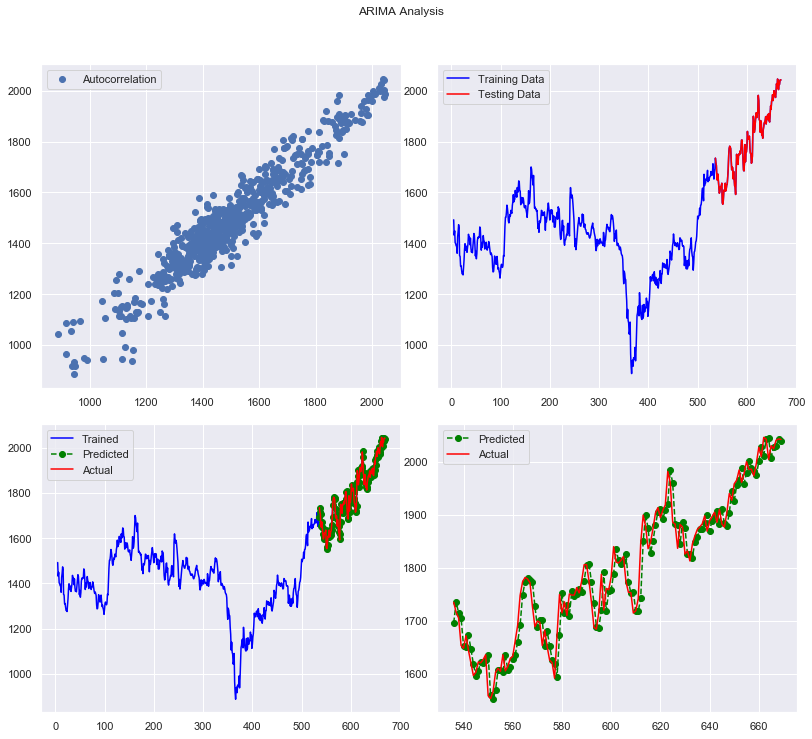

In [19]:
data = stockObj.historical_prices['Close'].values
result = get_arima_predictions(data, plot = True)
pd.DataFrame([result[0]])